## COAST: Consecutive multi-Omics Alignment of Spatial Tissues  
### Step-by-step Tutorial  

**Author:** Benedetta Manzato  
**Contact:** b.manzato@lumc.nl  
**Date:** 24 October 2025

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import scanpy as sc
import time

start_time = time.time()

<p style="font-size:15px; margin-top:0;">
We will apply <strong>COAST</strong> to the <em>Mouse Brain Sagittal Anterior</em> Visium dataset from 10x Genomics.
You can download the sections here: 
<a href="https://www.10xgenomics.com/datasets/mouse-brain-serial-section-1-sagittal-anterior-1-standard-1-1-0" target="_blank">section 1</a> and 
<a href="https://www.10xgenomics.com/datasets/mouse-brain-serial-section-2-sagittal-anterior-1-standard-1-1-0" target="_blank">section 2</a>.
</p>

<div style="border:2px solid #d00000; border-radius:8px; padding:16px; max-width:700px;">
  <p style="font-size:15px; margin-top:8px;">
    <strong style="color:#d00000;">Recap of input files required for COAST</strong>
  </p>
  <ul style="font-size:14px; margin-top:4px;">
    <li>
      <strong>Coordinate file</strong><br>
      • <strong style="color:#d00000;">Required to have same file name as image file</strong><br>
      • Supported format: <code>csv</code>, <code>h5ad</code> and <code>h5</code> (here coordinates will be read from the metadata (<code>object.obs</code>).<br>
      • Required columns: <code>x</code> and <code>y</code> (integer pixel coordinates).<br>
      • Index: spot IDs (e.g. Visium barcodes).<br>
    </li>
<li style="margin-top:14px;">
      <strong>Molecular / feature data</strong><br>
      • Supported formats: <code>csv</code>, <code>h5ad</code>, <code>h5</code> (10x HDF5)<br>
      • Rows = spot IDs (index), Columns = features/genes.<br>
      • Spot indexes should match between coordinate file and molecular data file.<br>
      • Coordinate files and molecular data files should placed in two different directories to prevent ambiguity in file naming and ensure correct pairing of data (e.g. <code>/mol_data</code> and <code>/coord</code>).<br>
    </li>

<li style="margin-top:14px;">
      <strong>High-resolution image</strong><br>
      • Any image format supported by PIL (JPEG, PNG, TIFF).<br>
      • The spots in the coordinate file should correspond to positions in the image. This is automatically the case for most major technologies; otherwise scaling/preprocessing will be required.<br>
    </li>
  </ul>
</div>


In [2]:
# Setup paths

base_dir = "/exports/humgen/bmanzato/COAST_git"

coord_files = [
    f"{base_dir}/coord/V1_Mouse_Brain_Sagittal_Anterior_Section_1.csv",
    f"{base_dir}/coord/V1_Mouse_Brain_Sagittal_Anterior_Section_2.csv"
]
image_files = [
    f"{base_dir}/img/V1_Mouse_Brain_Sagittal_Anterior_Section_1.tif",
    f"{base_dir}/img/V1_Mouse_Brain_Sagittal_Anterior_Section_2.tif"
]
moldata_files = [
    f"{base_dir}/mol_data/section1_h5_xy.h5ad",
    f"{base_dir}/mol_data/section2_h5_xy.h5ad"
]
outdir = "/exports/humgen/bmanzato/COAST_package/output/"

<p style="font-size:15px; margin-top:0;"> Inspect your images

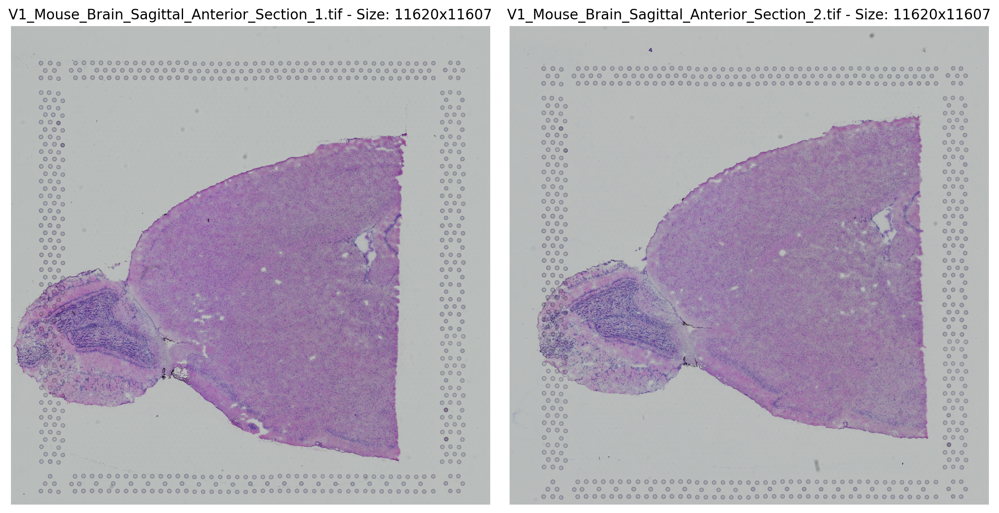

In [3]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=200)

for ax, img_path in zip(axes, image_files):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f"{os.path.basename(img_path)} - Size: {img.size[0]}x{img.size[1]}", fontsize=12)  # smaller font

plt.tight_layout()
plt.show()

<p style="font-size:15px; margin-top:0;"> Inspect coordinate and molecular data files and make sure they have the same number of observations

In [4]:
for coord_file, mol_file in zip(coord_files, moldata_files):
    # Load coordinates
    if coord_file.endswith(".csv"):
        coord_df = pd.read_csv(coord_file, index_col=0)
    elif coord_file.endswith(".h5ad"):
        adata = sc.read_h5ad(coord_file)
        coord_df = adata.obs[["x", "y"]].copy()
    elif coord_file.endswith(".h5"):
        adata = sc.read_10x_h5(coord_file)
        coord_df = adata.obs[["x", "y"]].copy()
    else:
        raise ValueError(f"Unsupported file type: {coord_file}")
    
    # Load molecular dataset
    if mol_file.endswith(".csv"):
        mol_df = pd.read_csv(mol_file, index_col=0)
    elif mol_file.endswith(".h5ad"):
        adata = sc.read_h5ad(mol_file)
        mol_df = pd.DataFrame(adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X,
                              index=adata.obs_names, columns=adata.var_names)
    else:
        raise ValueError(f"Unsupported file type: {mol_file}")
    
    # Check number of spots
    n_coord = coord_df.shape[0]
    n_mol = mol_df.shape[0]
    if n_coord != n_mol:
        print(f"[WARNING] Mismatch for {os.path.basename(coord_file)}:")
        print(f"  Number of coordinates = {n_coord}")
        print(f"  Number of molecular data rows = {n_mol}")
    else:
        print(f"[INFO] Coordinates file matches molecular data: {n_coord} spots")
    
    # Check x/y columns
    if not all(col in coord_df.columns for col in ["x", "y"]):
        raise ValueError(f"{coord_file} missing 'x' and/or 'y' columns")
    
    # Print x/y ranges clearly
    x_min, x_max = int(coord_df["x"].min()), int(coord_df["x"].max())
    y_min, y_max = int(coord_df["y"].min()), int(coord_df["y"].max())
    print(f"  x range: {x_min} - {x_max}")
    print(f"  y range: {y_min} - {y_max}")
    
    display(mol_df.head())
    display(coord_df.head())

[INFO] Coordinates file matches molecular data: 2695 spots
  x range: 1480 - 9533
  y range: 2684 - 10468


,Xkr4,Gm1992,Gm19938,Gm37381,Rp1,Sox17,Gm37587,Gm37323,Mrpl15,Lypla1,...,Gm16367,AC163611.1,AC163611.2,AC140365.1,AC124606.2,AC124606.1,AC133095.2,AC133095.1,AC234645.1,AC149090.1
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0
AAACAGAGCGACTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0
AAACAGGGTCTATATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0


,in_tissue,array_row,array_col,y,x
AAACAAGTATCTCCCA-1,1,50,102,7474,8500
AAACACCAATAACTGC-1,1,59,19,8552,2788
AAACAGAGCGACTCCT-1,1,14,94,3163,7950
AAACAGCTTTCAGAAG-1,1,43,9,6636,2100
AAACAGGGTCTATATT-1,1,47,13,7115,2375


[INFO] Coordinates file matches molecular data: 2823 spots
  x range: 1578 - 10113
  y range: 1980 - 10003


,Xkr4,Gm1992,Gm19938,Gm37381,Rp1,Sox17,Gm37587,Gm37323,Mrpl15,Lypla1,...,Gm16367,AC163611.1,AC163611.2,AC140365.1,AC124606.2,AC124606.1,AC133095.2,AC133095.1,AC234645.1,AC149090.1
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
AAACAGAGCGACTCCT-1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.0
AAACAGGGTCTATATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0


,in_tissue,array_row,array_col,y,x
AAACAAGTATCTCCCA-1,1,50,102,7608,8599
AAACACCAATAACTGC-1,1,59,19,8686,2886
AAACAGAGCGACTCCT-1,1,14,94,3297,8048
AAACAGCTTTCAGAAG-1,1,43,9,6770,2198
AAACAGGGTCTATATT-1,1,47,13,7249,2473


<p style="font-size:16px; margin-top:0;"> Make sure that the coordinate file and the images are in the same coordinate framework: plot images with coordinates overlaid

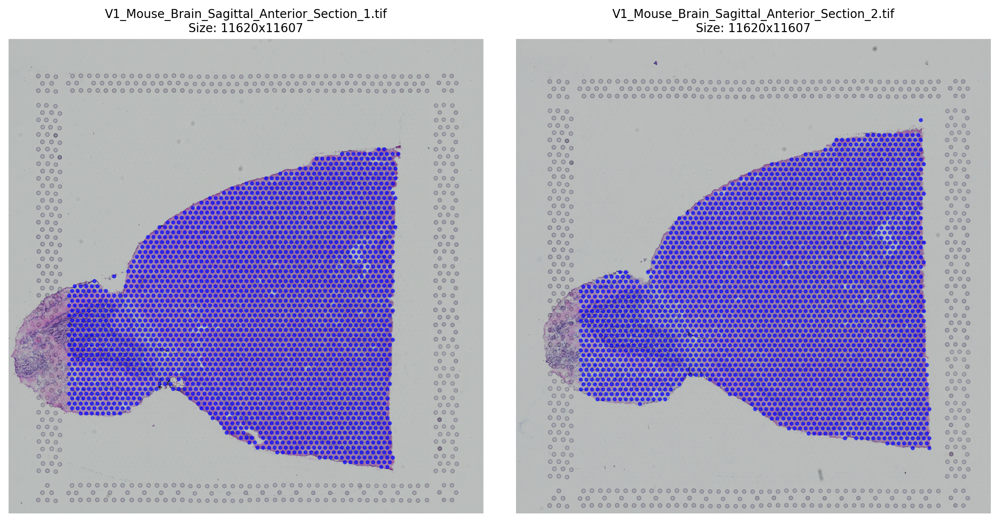

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=200)

for ax, img_path, coord_path in zip(axes, image_files, coord_files):
    # Load image
    img = Image.open(img_path)

    # Load coordinates (support csv, h5ad, h5)
    if coord_path.endswith(".csv"):
        df = pd.read_csv(coord_path, index_col=0)
    elif coord_path.endswith(".h5ad"):
        adata = sc.read_h5ad(coord_path)
        df = adata.obs[['x', 'y']].copy()
    elif coord_path.endswith(".h5"):
        adata = sc.read_10x_h5(coord_path)
        df = adata.obs[['x', 'y']].copy()
    else:
        raise ValueError(f"Unsupported coordinate file: {coord_path}")

    # Plot image
    ax.imshow(img)

    # Overlay points
    if 'x' in df.columns and 'y' in df.columns:
        ax.scatter(df['x'], df['y'], s=6, c='blue', alpha=0.6)

    ax.axis('off')
    ax.set_title(f"{os.path.basename(img_path)}\nSize: {img.size[0]}x{img.size[1]}", fontsize=10)

plt.tight_layout()
plt.show()

### Module 1: extract features from high-res images

<p style="font-size:16px; margin-top:8px;">
<strong> <code>extract_features</code> function arguments</strong>
</p>
<ul style="font-size:14px; margin-top:4px;">
  <li><strong>coord_path (str, required)</strong><br>
    • Path to the CSV file containing spot coordinates.<br>
    • Required columns: <code>x</code> and <code>y</code> (integer pixel coordinates).<br>
    • Index should be spot IDs (e.g., Visium barcodes).<br>
    • Spots must correspond to positions in the tissue image.
  </li>

  <li style="margin-top:14px;"><strong>img_path (str, required)</strong><br>
    • Path to the high-resolution tissue image.<br>
    • Supported formats: JPEG, PNG, TIFF.<br>
    • Spots in the coord file should correspond to positions in this image.
  </li>

  <li style="margin-top:14px;"><strong>output_name (str, required)</strong><br>
    • Prefix for the output CSV files.<br>
  </li>

  <li style="margin-top:14px;"><strong>outdir (str, required)</strong><br>
    • Directory where the ViT features folder and output CSVs will be saved.
  </li>

  <li style="margin-top:14px;"><strong>patch_size (int, default=224)</strong><br>
    • Width and height of each square patch (in pixels) extracted from the image.
  </li>

  <li style="margin-top:14px;"><strong>step_size (int, default=224)</strong><br>
    • Step size for grid-based patch extraction (in pixels).<br>
    • Determines the spacing between grid patches.
  </li>

  <li style="margin-top:14px;"><strong>pad (str, default='none')</strong><br>
    • Options: <code>none</code>, <code>left</code>, <code>right</code>, <code>top</code>, <code>bottom</code>.<br>
    • Adds padding to the image before patch extraction to further guide the alignment.
  </li>

  <li style="margin-top:14px;"><strong>mode (str, default='moldata')</strong><br>
    • Options: <code>moldata</code> (tissue-guided + grid patches) or <code>nomoldata</code> (grid patches only).
  </li>
</ul>


In [6]:
# set output name as the name of the image files
tissues = [os.path.splitext(os.path.basename(f))[0] for f in image_files]

tissues

['V1_Mouse_Brain_Sagittal_Anterior_Section_1',
 'V1_Mouse_Brain_Sagittal_Anterior_Section_2']

In [7]:
from COAST.extract_features import extract_features

results = {}
for section, output_name in zip(tissues, tissues):
    coord_file = f"{base_dir}/coord/{section}.csv"
    img_file = f"{base_dir}/img/{section}.tif"
    
    features, coords = extract_features(
        coord_path=coord_file,
        img_path=img_file,
        output_name=output_name,
        outdir=outdir,
        patch_size=224,
        step_size=224,
        pad="none",
        mode="moldata"
    )

    results[output_name] = {"features": features, "coords": coords}
    print(f"[INFO] Finished extracting features for {section}")
    print('\n\n')

[INFO] Loaded 2695 coordinates from /exports/humgen/bmanzato/COAST_git/coord/V1_Mouse_Brain_Sagittal_Anterior_Section_1.csv
[INFO] Loaded image /exports/humgen/bmanzato/COAST_git/img/V1_Mouse_Brain_Sagittal_Anterior_Section_1.tif with size (11620, 11607)


Using cache found in /home/bmanzato/.cache/torch/hub/facebookresearch_dino_main


[INFO] ViT model loaded on cuda
[INFO] Extracting tissue-guided patches...
[INFO] Total tissue patches: 2695
[INFO] Extracting grid patches...
[INFO] Total grid patches: 5296
[INFO] Extracting features from 5296 patches...


Patches: 100%|██████████| 5296/5296 [00:30<00:00, 170.87it/s]


[INFO] Saved ViT features to /exports/humgen/bmanzato/COAST_package/output/ViT_features/V1_Mouse_Brain_Sagittal_Anterior_Section_1_vit_mf.csv
[INFO] Saved patch coordinates to /exports/humgen/bmanzato/COAST_package/output/ViT_features/V1_Mouse_Brain_Sagittal_Anterior_Section_1_vit_coord.csv
[INFO] Finished extracting features for V1_Mouse_Brain_Sagittal_Anterior_Section_1



[INFO] Loaded 2823 coordinates from /exports/humgen/bmanzato/COAST_git/coord/V1_Mouse_Brain_Sagittal_Anterior_Section_2.csv
[INFO] Loaded image /exports/humgen/bmanzato/COAST_git/img/V1_Mouse_Brain_Sagittal_Anterior_Section_2.tif with size (11620, 11607)


Using cache found in /home/bmanzato/.cache/torch/hub/facebookresearch_dino_main


[INFO] ViT model loaded on cuda
[INFO] Extracting tissue-guided patches...
[INFO] Total tissue patches: 2823
[INFO] Extracting grid patches...
[INFO] Total grid patches: 5424
[INFO] Extracting features from 5424 patches...


Patches: 100%|██████████| 5424/5424 [00:29<00:00, 185.72it/s]


[INFO] Saved ViT features to /exports/humgen/bmanzato/COAST_package/output/ViT_features/V1_Mouse_Brain_Sagittal_Anterior_Section_2_vit_mf.csv
[INFO] Saved patch coordinates to /exports/humgen/bmanzato/COAST_package/output/ViT_features/V1_Mouse_Brain_Sagittal_Anterior_Section_2_vit_coord.csv
[INFO] Finished extracting features for V1_Mouse_Brain_Sagittal_Anterior_Section_2





<p style="font-size:15px; margin-top:0;"> Visualize the in-tissue and grid patches 

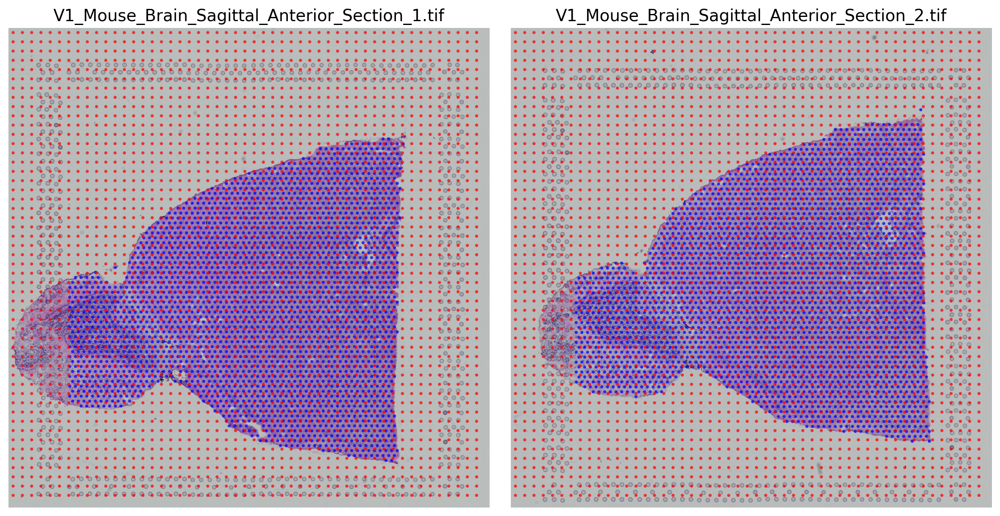

In [9]:
image_dir = f"{base_dir}/img"
vit_dir = f"{outdir}/ViT_features/"

image_files = sorted([
    os.path.join(image_dir, f) for f in os.listdir(image_dir)
    if f.lower().endswith(('.tif', '.tiff', '.png', '.jpg'))
])

vit_coord_files = sorted([
    os.path.join(vit_dir, f) for f in os.listdir(vit_dir)
    if f.lower().endswith('_vit_coord.csv')
])

fig, axes = plt.subplots(1, len(image_files), figsize=(6*len(image_files), 6), dpi=200)

for ax, img_path, coord_path in zip(axes, image_files, vit_coord_files):
    # Load image
    img = Image.open(img_path)
    
    # Load coordinates
    df = pd.read_csv(coord_path, index_col=0)
    
    # Determine dot colors
    colors = ['blue' if str(idx).endswith('_intissue') else 'red' for idx in df.index]
    
    # Plot
    ax.imshow(img)
    ax.scatter(df['x'], df['y'], s=3, c=colors, alpha=0.6)
    ax.axis('off')
    ax.set_title(os.path.basename(img_path), fontsize=14)

plt.tight_layout()
plt.show()

<p style="font-size:15px; margin-top:8px;">
Here we can visualize tissue sections using features extracted from high-resolution images. <code>run_umap_clustering</code> performs three main tasks:
</p>
<ul style="font-size:15px; margin-top:4px;">
  <li><strong>UMAP clustering:</strong> Combines features from all tissue sections, reduces their dimensionality with UMAP, and groups similar tiles into clusters. Clusters are shown both by color and by tissue section.</li>
  <li style="margin-top:15px;"><strong>Spatial plots:</strong> Shows the location of each tile on the original tissue image, colored by cluster, so you can see how similar regions are distributed spatially.</li>
</ul>

<p style="font-size:15px; margin-top:4px;">
When <code>background=True</code>, the plot includes both tissue-guided and grid patches; when <code>background=False</code>, only the molecular-data spots are shown.
</p>

[INFO] Loaded 5518 patches from 2 sections
[INFO] Dataset with UMAP + clusters saved in: /exports/humgen/bmanzato/COAST_package/output/ViT_features/umap_clusters_concatenated_sections.csv


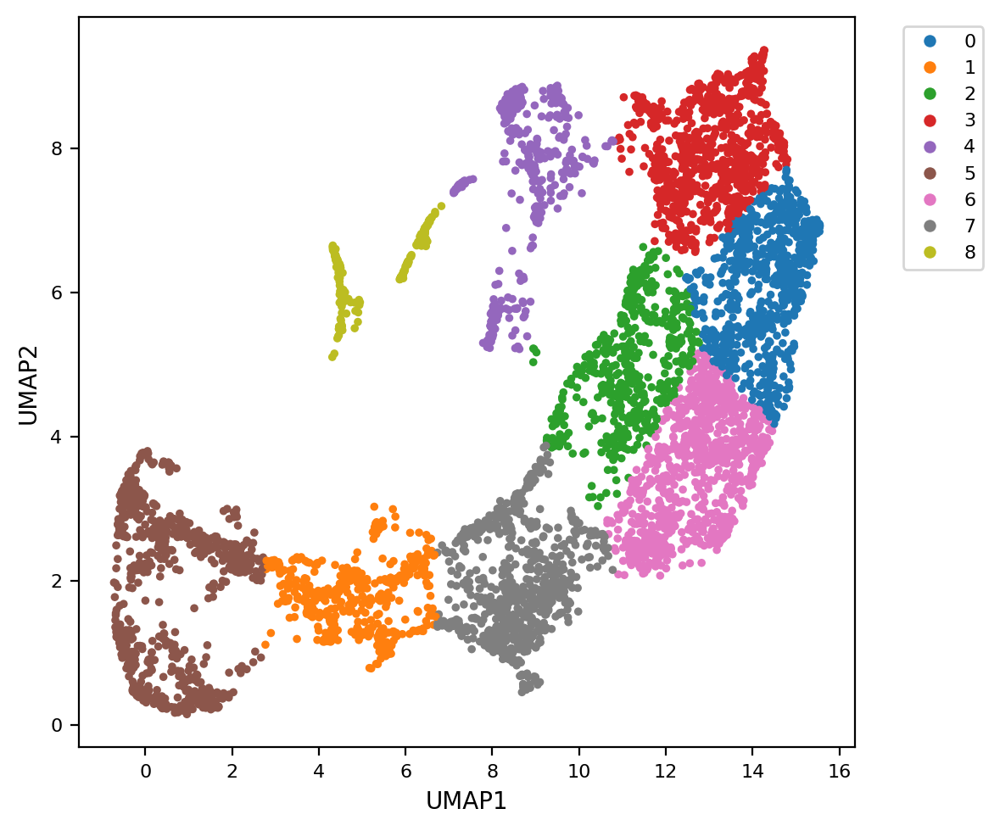

[INFO] UMAP cluster plot saved in: /exports/humgen/bmanzato/COAST_package/output/visualization/umap_clusters.png


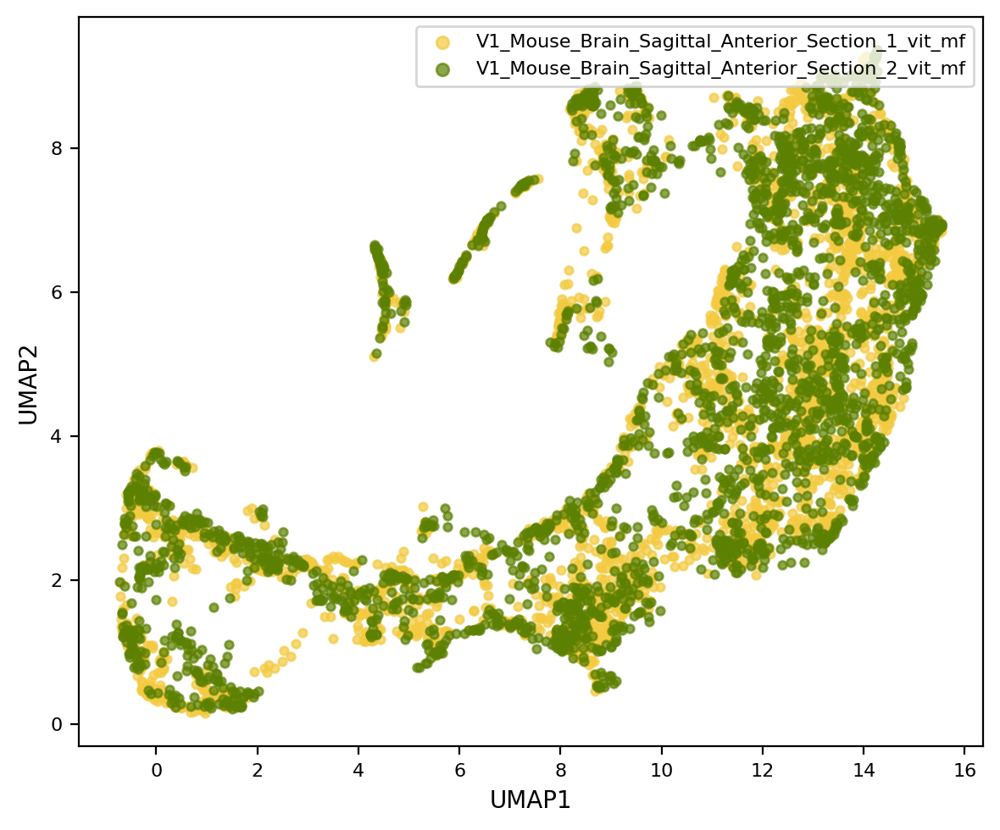

[INFO] UMAP plot colored by tissue saved in: /exports/humgen/bmanzato/COAST_package/output/visualization/umap_by_section.png


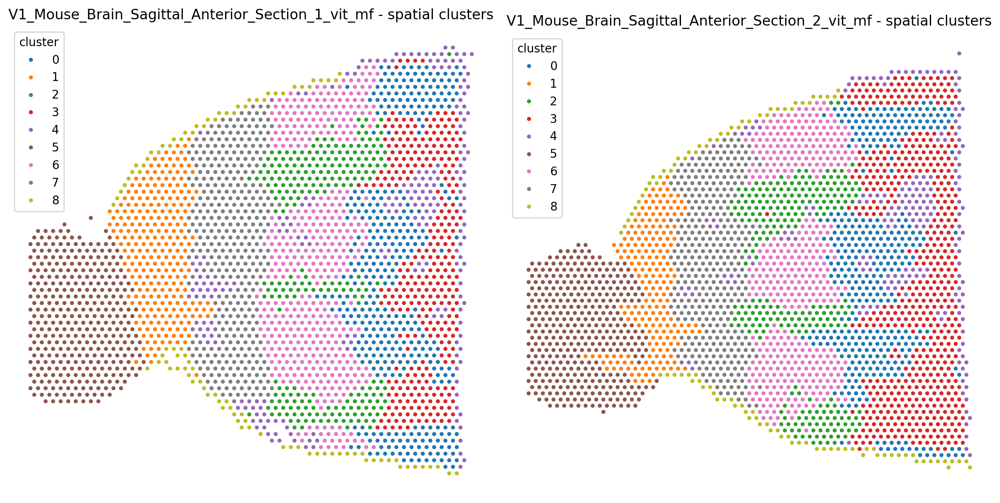

[INFO] Spatial cluster plots saved in: /exports/humgen/bmanzato/COAST_package/output/visualization/spatial_clusters.png


In [10]:
from COAST.coast_visualization import run_umap_clustering

df_all = run_umap_clustering(outdir, n_clusters=9, spot_size=12, background=False)

### Module 2: map patches across modalities with CAST

<p style="font-size:15px; margin-top:0;"> Now we will use the morphology image embeddings to map the query spots to the reference coordinate space

<p style="font-size:15px; margin-top:8px;">
<strong> <code>run_cast</code> function arguments</strong>
</p>
<ul style="font-size:15px; margin-top:4px;">
  <li><strong>outdir (str, required)</strong><br>
    • Base output directory for COAST / ViT features.<br>
    • Expects a subfolder <code>ViT_features/</code> containing <code>*_vit_mf.csv</code> and <code>*_vit_coord.csv</code> files for each tissue.<br>
    • Will create a <code>CAST_output/</code> subfolder to store aligned coordinates.
  </li>
</ul>

<p style="font-size:15px; margin-top:8px;">
<li style="margin-top:15px;"><strong>Outputs</strong><br>
    • <code>CAST_output/*_aligned.csv</code>: Aligned coordinates for each tissue, indexed by original patch IDs.<br>
    • Tensors used in alignment saved as <code>.pt</code> files for reproducibility.
  </li>
  </li>
</ul>


In [ ]:
from COAST.CAST_alignment import run_cast

run_cast(outdir)

[INFO] Loaded tissue 'V1_Mouse_Brain_Sagittal_Anterior_Section_1' with 5296 tiles
[INFO] Loaded tissue 'V1_Mouse_Brain_Sagittal_Anterior_Section_2' with 5424 tiles
[INFO] Concatenating all tissues for CAST...
[INFO] Total tiles: 10720
Preprocessing...
The number of nodes is larger than the total number of nodes. Return the original data.
The number of nodes is larger than the total number of nodes. Return the original data.
[INFO] Running CAST_STACK...


Loss: 1911.389: 100%|██████████| 500/500 [00:08<00:00, 57.96it/s]
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' no

<p style="font-size:15px; margin-top:8px;">
After aligning multiple tissue sections with CAST, <code>plot_final_aligned_scatter</code> shows all sections together in the common coordinate space.</p>

<p style="font-size:15px; margin-top:4px;">
When <code>background=True</code>, the plot includes both tissue-guided and grid patches; when <code>background=False</code>, only the molecular-data spots are shown.
</p>

In [ ]:
from COAST.coast_visualization import plot_final_aligned_scatter

plot_final_aligned_scatter(outdir, spot_size=25, background=False)

In [ ]:
plot_final_aligned_scatter(outdir, spot_size=25, background=True)

<p style="font-size:15px; margin-top:8px;">
This module builds a combined dataset from two tissue sections. Spots are matched using a KD-tree based on the closest Euclidean distance, with a <strong>maximum distance threshold</strong> that should be chosen according to the step size between molecular spots.
</p>

<ul style="font-size:15px; margin-top:4px;">
  <li style="margin-top:8px;"><strong>match_spots:</strong> Matches spots between tissues using KD-tree based on the closest Euclidean distance and uses a distance threshold (<code>max_distance</code> that should be chosen according to the step size between molecular spots.</li>
  <li style="margin-top:8px;"><strong>build_multimodal_anndata:</strong> Combines matched features into a single AnnData object. If metadata is provided, it is concatenated in <code>.obs</code>.</li>
</ul>

<p style="font-size:15px; margin-top:8px;">
The final AnnData is saved to <code>outdir/multimodal_anndata/multimodal_dataset.h5ad</code>.
</p>


In [ ]:
from COAST.spot_matching import match_spots, build_multimodal_anndata

max_distance = 64

# Returns DataFrame with aligned indices
ccf_matches = match_spots(outdir, max_distance=max_distance)
ccf_matches.head()

In [ ]:
### only works if mode = 'moldata'

mol_dir = "/exports/humgen/bmanzato/COAST_git/mol_data"
coord_dir = "/exports/humgen/bmanzato/COAST_git/coord"

multimodal_anndata = build_multimodal_anndata(
    outdir=outdir,
    mol_dir=mol_dir,
    coord_dir=coord_dir,
    metadata=coord_dir,
    max_distance=max_distance
)


In [ ]:
end_time = time.time()
elapsed = end_time - start_time
elapsed_min = elapsed / 60
print(f"COAST runtime: {elapsed_min:.2f} minutes")